In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import folium
import seaborn as sns
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from folium.plugins import MarkerCluster


In [83]:
BASE_DIR = Path().resolve().parents[0] 
csv_path = BASE_DIR / 'data' / 'processed' / 'Antioquia_2021_completed.csv'


In [84]:
df = pd.read_csv(csv_path)
df.head()

,a_o,tipoatencion,numeroatenciones,codigo_departamento,nombre_departamento,codigo_municipio,nombre_municipio,codigo_diagnostico,n_diagnostico,capitulo,latitud,longitud
0,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,E02X,HIPOTIROIDISMO SUBCLINICO POR DEFICIENCIA DE YODO,"IV - Endocrinas, nutricionales y metabólicas",6.611418,-75.775671
1,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F069,TRASTORNO MENTAL NO ESPECIFICADO DEBIDO A LESI...,V - Mentales y de comportamiento,6.611418,-75.775671
2,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F412,TRASTORNO MIXTO DE ANSIEDAD Y DEPRESION,V - Mentales y de comportamiento,6.611418,-75.775671
3,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F510,INSOMNIO NO ORGANICO,V - Mentales y de comportamiento,6.611418,-75.775671
4,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F529,"DISFUNCION SEXUAL, NO OCASIONADA POR TRASTORNO...",V - Mentales y de comportamiento,6.611418,-75.775671


In [85]:
df.columns

Index(['a_o', 'tipoatencion', 'numeroatenciones', 'codigo_departamento',
       'nombre_departamento', 'codigo_municipio', 'nombre_municipio',
       'codigo_diagnostico', 'n_diagnostico', 'capitulo', 'latitud',
       'longitud'],
      dtype='object')

In [86]:
print(df.shape)
df.info()

(278271, 12)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278271 entries, 0 to 278270
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   a_o                  278271 non-null  int64  
 1   tipoatencion         278271 non-null  object 
 2   numeroatenciones     278271 non-null  int64  
 3   codigo_departamento  278271 non-null  int64  
 4   nombre_departamento  278271 non-null  object 
 5   codigo_municipio     278271 non-null  int64  
 6   nombre_municipio     278271 non-null  object 
 7   codigo_diagnostico   278271 non-null  object 
 8   n_diagnostico        278271 non-null  object 
 9   capitulo             277390 non-null  object 
 10  latitud              278271 non-null  float64
 11  longitud             278271 non-null  float64
dtypes: float64(2), int64(4), object(6)
memory usage: 25.5+ MB


In [87]:
#Heat map, number of medical services rendered
coords = df[['latitud', 'longitud', 'numeroatenciones']].dropna()

m = folium.Map(location=[6.5, -75.5], zoom_start=7)

HeatMap(data=coords[['latitud', 'longitud', 'numeroatenciones']].values, radius=15).add_to(m)

m


In [88]:
import folium

# Filtrar por diagnóstico
diag = 'I10X'
df_diag = df[df['codigo_diagnostico'] == diag]

# Crear mapa
m = folium.Map(location=[6.5, -75.5], zoom_start=7)

for _, row in df_diag.iterrows():
    if pd.notna(row['latitud']) and pd.notna(row['longitud']):
        folium.Circle(
            location=[row['latitud'], row['longitud']],
            radius = np.log1p(row['numeroatenciones']) * 500, # escala logarítmica
            popup=f"{row['nombre_municipio']} ({row['numeroatenciones']} atenciones)",
            color='blue',
            fill=True,
            fill_opacity=0.6
        ).add_to(m)

m


In [89]:

# Crear mapa base
m = folium.Map(location=[6.5, -75.5], zoom_start=7)

# Preparar datos (filtrar diagnóstico específico si querés)
df_heat = df[df['codigo_diagnostico'] == 'I10X'].dropna(subset=['latitud', 'longitud'])

# Agregar capa de calor
HeatMap(
    data=df_heat[['latitud', 'longitud', 'numeroatenciones']].values,
    radius=20
).add_to(m)

m

In [90]:
df = df.drop(df[df['codigo_diagnostico'] == '1'].index)
print(df.shape)

(278196, 12)


In [91]:
df['numeroatenciones'].sum()

18063156

In [92]:
df_geo = df[['nombre_municipio', 'codigo_diagnostico', 'numeroatenciones', 'latitud', 'longitud']].dropna()
df_geo = df_geo.copy()


In [93]:
df_geo = df_geo.groupby(['nombre_municipio', 'codigo_diagnostico', 'latitud', 'longitud']).agg({
    'numeroatenciones': 'sum'
}).reset_index()

In [94]:
df_geo

,nombre_municipio,codigo_diagnostico,latitud,longitud,numeroatenciones
0,Abejorral,A085,5.803728,-75.438474,1
1,Abejorral,A090,5.803728,-75.438474,2
2,Abejorral,A099,5.803728,-75.438474,3
3,Abejorral,A281,5.803728,-75.438474,1
4,Abejorral,A483,5.803728,-75.438474,1
...,...,...,...,...,...
181699,Zaragoza,Z952,7.474004,-74.858483,7
181700,Zaragoza,Z955,7.474004,-74.858483,1
181701,Zaragoza,Z958,7.474004,-74.858483,1
181702,Zaragoza,Z961,7.474004,-74.858483,57


## DBSCAN Algo

In [95]:
# 4. Eliminar duplicados exactos (opcional pero útil si hay datos repetidos)
df_geo = df_geo.drop_duplicates(subset=['latitud', 'longitud'])

# 5. Preparar datos para clustering
X = df_geo[['latitud', 'longitud']].values
X_scaled = StandardScaler().fit_transform(X)

# 6. Aplicar DBSCAN (ajusta eps y min_samples según tus necesidades)
db = DBSCAN(eps=0.5, min_samples=3, n_jobs=-1)  # Usa todos los núcleos disponibles
df_geo['cluster'] = db.fit_predict(X_scaled)

# 7. Visualizar los clusters en un mapa
m = folium.Map(location=[6.5, -75.5], zoom_start=7)
marker_cluster = MarkerCluster().add_to(m)

# Lista de colores para los clusters
colors = [
    'red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige',
    'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink',
    'lightblue', 'lightgreen', 'gray'
]

# 8. Añadir puntos al mapa
for _, row in df_geo.iterrows():
    cluster_id = row['cluster']
    color = colors[cluster_id % len(colors)] if cluster_id != -1 else 'gray'
    
    folium.CircleMarker(
        location=[row['latitud'], row['longitud']],
        radius=3,  # Reducido para evitar solapamiento excesivo
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"Municipio: {row['nombre_municipio']}<br>"
            f"Diagnóstico: {row['codigo_diagnostico']}<br>"
            f"Cluster: {cluster_id}"
        )
    ).add_to(marker_cluster)


/tmp/ipykernel_22019/1421422515.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geo['cluster'] = db.fit_predict(X_scaled)


In [96]:
m

In [97]:
df_geo.groupby('cluster').agg({
    'nombre_municipio': 'nunique',
    'codigo_diagnostico': 'nunique',
    'numeroatenciones': 'sum'
}).rename(columns={
    'nombre_municipio': 'municipios_unicos',
    'codigo_diagnostico': 'diagnosticos_unicos'
}).sort_values('numeroatenciones', ascending=False)


,municipios_unicos,diagnosticos_unicos,numeroatenciones
cluster,,,
0,109,40,367
-1,8,7,19
2,4,3,11
1,4,4,5


🧠 ¿Qué significa cada uno?
✅ Cluster 0:
Es el más grande y denso.

Agrupa la gran mayoría de municipios (109), con 40 tipos de diagnósticos y 367 atenciones.

Este es el cluster principal; DBSCAN lo consideró una gran región conectada espacialmente con suficiente densidad.

⚠️ Clusters 1 y 2:
Son más pequeños y localizados.

Cluster 2: 4 municipios, 3 diagnósticos, 11 atenciones.

Cluster 1: 4 municipios, 4 diagnósticos, 5 atenciones.

Estos podrían representar zonas específicas con un patrón distinto de enfermedades o localización más aislada del grupo principal.

❌ Cluster -1:
Esto es ruido según DBSCAN.

Contiene municipios/diagnósticos que no se pudieron agrupar porque están muy aislados o son pocos casos.

Este grupo es importante si quieres estudiar casos atípicos o extremos.

In [98]:
for cluster_id in df_geo['cluster'].unique():
    print(f"\nCluster {cluster_id}")
    display(df_geo[df_geo['cluster'] == cluster_id][['nombre_municipio', 'codigo_diagnostico']].head(10))




Cluster 0


,nombre_municipio,codigo_diagnostico
0,Abejorral,A085
1057,Abriaqui,A150
1282,Alejandria,A064
1722,Amaga,A028
3650,Amalfi,A047
5048,Andes,A062
6593,Angelopolis,A059
7219,Angostura,A011
8923,Anori,A009
11091,Anza,A662



Cluster 1


,nombre_municipio,codigo_diagnostico
11448,Apartado,A000
39420,Carepa,A001
47624,Chigorodo,A048
165027,Turbo,A009



Cluster 2


,nombre_municipio,codigo_diagnostico
15765,Arboletes,A028
123454,Necocli,A009
142859,San Juan De Uraba,A069
145696,San Pedro De Uraba,A009



Cluster -1


,nombre_municipio,codigo_diagnostico
63914,El Bagre,A010
119675,Murindo,A099
119852,Mutata,A059
121282,Nechi,A009
170552,Urrao,A062
175824,Vigia Del Fuerte,A010
178857,Yondo,A090
179370,Zaragoza,A001


In [99]:
df_geo[df_geo['cluster'] == 0].groupby('codigo_diagnostico')['numeroatenciones'].sum().sort_values(ascending=False)


codigo_diagnostico
A000    53
A090    51
A009    36
A049    30
A047    29
A419    24
A060    23
A059    18
A020    17
A064    10
A021     7
A011     6
A069     6
A062     5
A070     5
A050     4
A085     4
A010     3
A058     3
A013     3
A188     3
A084     3
A029     2
A038     2
A099     2
A083     2
A001     2
B360     2
A071     1
A066     1
A061     1
A150     1
A158     1
A163     1
A012     1
A260     1
A415     1
A028     1
A513     1
A662     1
Name: numeroatenciones, dtype: int64

"En el año 2021, los municipios agrupados en el cluster 0, geográficamente cercanos entre sí, registraron una alta proporción de atenciones por enfermedades infecciosas y parasitarias (códigos A del CIE-10), como cólera, fiebre tifoidea, shigelosis, hepatitis y otras."

In [100]:
# Añadir una columna que identifique si el diagnóstico pertenece al grupo A
df_geo['es_infecciosa'] = df_geo['codigo_diagnostico'].str.startswith('A')

# Proporción de enfermedades infecciosas por cluster
proporcion_infecciosas = df_geo.groupby('cluster')['es_infecciosa'].mean().reset_index()
proporcion_infecciosas.columns = ['cluster', 'proporcion_enfermedades_infecciosas']
total_atenciones_cluster = df_geo.groupby('cluster')['numeroatenciones'].sum().reset_index()
comparativo = proporcion_infecciosas.merge(total_atenciones_cluster, on='cluster')
comparativo.columns = ['cluster', 'proporcion_infecciosas', 'total_atenciones']
print(comparativo.sort_values('proporcion_infecciosas', ascending=False))

   cluster  proporcion_infecciosas  total_atenciones
0       -1                1.000000                19
2        1                1.000000                 5
3        2                1.000000                11
1        0                0.990826               367


/tmp/ipykernel_22019/2523379662.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geo['es_infecciosa'] = df_geo['codigo_diagnostico'].str.startswith('A')


Sí es válido decir que el cluster 0 representa una agrupación geográfica de municipios donde predominan las enfermedades infecciosas del capítulo A del CIE-10.

Aunque otros clusters también tienen 100% de infecciosas, su bajo volumen los hace menos relevantes para el análisis poblacional o de salud pública.

El cluster 0 es el que más contribuye en términos absolutos a la carga de morbilidad por enfermedades infecciosas en tu dataset.

In [101]:
import folium
from folium.plugins import MarkerCluster

# 1. Filtrar datos del cluster 0
df_cluster0 = df_geo[df_geo['cluster'] == 0]

# 2. Agrupar por municipio para sumar atenciones
df_mapa = df_cluster0.groupby(['nombre_municipio', 'latitud', 'longitud'])['numeroatenciones'].sum().reset_index()

# 3. Crear mapa centrado en Antioquia
centro_mapa = [df_mapa['latitud'].mean(), df_mapa['longitud'].mean()]
m = folium.Map(location=centro_mapa, zoom_start=8)

# 4. Agregar los puntos ponderados
for i, row in df_mapa.iterrows():
    folium.CircleMarker(
        location=[row['latitud'], row['longitud']],
        radius=row['numeroatenciones']**0.5,  # Escala para visualización
        popup=(f"<b>{row['nombre_municipio']}</b><br>"
               f"Atenciones: {row['numeroatenciones']}"),
        color='crimson',
        fill=True,
        fill_color='crimson',
        fill_opacity=0.6
    ).add_to(m)

# 5. Mostrar el mapa
m


“Nuestros resultados espaciales indican que municipios del Nordeste antioqueño como Amalfi, San Andrés de Cuerquia y Santo Domingo presentan una alta concentración de enfermedades del capítulo A (infecciosas y parasitarias). Esta distribución coincide con los reportes del Boletín Epidemiológico de Antioquia 2021 del INS/SIVIGILA, que señala brotes de dengue, malaria y leptospira en estas zonas rurales.”

## K-Means para Agrupación Geoespacial + Diagnósticos

In [102]:
import umap

# 1. Crear matriz (rellenando NaN con 0)
matriz = pd.pivot_table(
    df,
    index=['nombre_municipio', 'latitud', 'longitud'],
    columns='codigo_diagnostico',
    values='numeroatenciones',
    aggfunc='sum',
    fill_value=0  # ¡Clave para evitar NaN!
).reset_index()

# 2. Reducción dimensional (UMAP)
X_umap = umap.UMAP(n_components=2, random_state=42).fit_transform(matriz.iloc[:, 3:])  # Columnas 3+ son códigos

# 3. Clustering (K-Means)
from sklearn.cluster import KMeans
X_final = np.concatenate([X_umap, StandardScaler().fit_transform(matriz[['latitud', 'longitud']])], axis=1)


/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` 

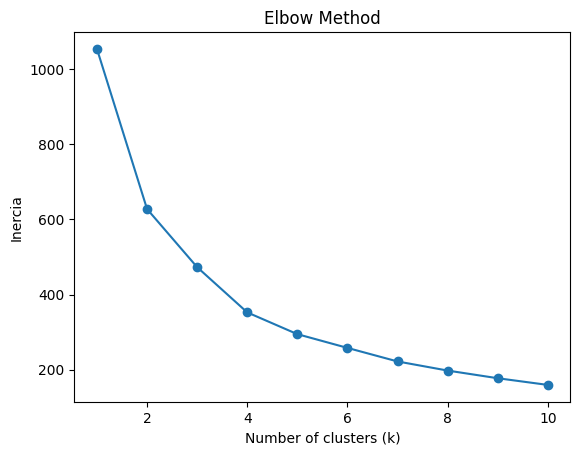

In [103]:
#Define amount of clusters

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertias = []
for k in range(1, 11):  # Probamos de 1 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_final)  # X_final es tu matriz con UMAP + lat/long
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inercia')
plt.title('Elbow Method')
plt.show()

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` 

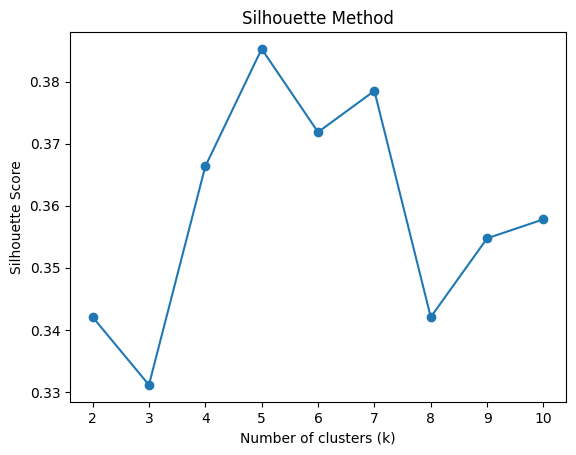

In [104]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):  # silhouette_score no funciona con k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_final)
    score = silhouette_score(X_final, labels)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method')
plt.show()

In [105]:
matriz['cluster'] = KMeans(n_clusters=5).fit_predict(X_final)

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [106]:
# 1. Definir colores para clusters
colores_clusters = {
    0: 'red',
    1: 'blue',
    2: 'green',
    3: 'purple',
    4: 'orange'
}

# 2. Crear mapa base
m = folium.Map(location=[6.5, -75.5], zoom_start=8)

# 3. Añadir puntos al mapa
for idx, row in matriz.iterrows():
    folium.CircleMarker(
        location=[row['latitud'], row['longitud']],
        radius=6,
        color=colores_clusters[row['cluster']],  # Usar el diccionario de colores
        fill=True,
        fill_opacity=0.7,
        popup=f"""
        Municipio: {row['nombre_municipio']}<br>
        Cluster: {row['cluster']}
        """
    ).add_to(m)


In [107]:
m

In [108]:
print(matriz['cluster'].value_counts())

1    33
4    28
0    28
2    28
3     8
Name: cluster, dtype: int64


In [111]:
# Obtener los clusters únicos presentes en los datos
clusters_presentes = np.sort(matriz['cluster'].unique())

for cluster in clusters_presentes:
    print(f"\nCluster {cluster}:")
    top_diagnosticos = matriz[matriz['cluster'] == cluster].iloc[:, 3:-1].mean().nlargest(3)
    print(top_diagnosticos)


Cluster 0:
codigo_diagnostico
R448    2169.678571
I10X     567.714286
Z017     303.857143
dtype: float64

Cluster 1:
codigo_diagnostico
Z017    473.363636
I10X    434.090909
Z108    373.515152
dtype: float64

Cluster 2:
codigo_diagnostico
I10X    10883.571429
Z012     4699.464286
Z298     3769.607143
dtype: float64

Cluster 3:
codigo_diagnostico
R69X    11751.250
I10X    10763.625
R448     8544.875
dtype: float64

Cluster 4:
codigo_diagnostico
Z718    50041.285714
I10X    36383.535714
R448    15638.214286
dtype: float64


In [113]:
# Ejemplo: Top 3 municipios del Cluster 4
top_municipios = matriz[matriz['cluster'] == 4].nlargest(3, 'Z718')[['nombre_municipio', 'Z718']]
print(top_municipios)

codigo_diagnostico nombre_municipio    Z718
68                         Medellin  861927
15                            Bello  160393
57                           Itagui  107266


Análisis por Cluster
Cluster 0: "Síntomas neurológicos/inespecíficos + Hipertensión"
Diagnósticos principales:

R448 (Otros síntomas/signos generales): 2,170 casos

Ejemplos: Mareos, hormigueos, malestar no especificado.

I10X (Hipertensión esencial): 568 casos

Z017 (Examen médico general): 304 casos

Interpretación:

Municipios con alta demanda por síntomas inespecíficos, posiblemente asociados a:

Estrés psicosocial.

Limitado acceso a diagnóstico especializado (pacientes llegan con síntomas avanzados).

Acción recomendada:

Capacitar a médicos de primer nivel en neurología básica.

Implementar protocolos de triaje para descartar causas graves.

Cluster 1: "Prevención y manejo crónico"
Diagnósticos principales:

Z017 (Examen médico general): 473 casos

I10X (Hipertensión): 434 casos

Z108 (Otros exámenes especiales): 374 casos

Interpretación:

Perfil de municipios con enfoque en medicina preventiva y seguimiento de crónicos.

Posiblemente zonas con mejor acceso a servicios de salud.

Acción recomendada:

Replicar este modelo en otros clusters (ej: promoción de chequeos anuales).

Cluster 2: "Hipertensión dominante con alta demanda hospitalaria"
Diagnósticos principales:

I10X (Hipertensión): 10,884 casos (¡Alerta epidemiológica!)

Z012 (Exámenes para procedimientos administrativos): 4,699 casos

Z298 (Cuidados postratamiento): 3,770 casos

Interpretación:

Zona con alta prevalencia de hipertensión y necesidad de seguimiento continuo.

Posiblemente población envejecida o con factores de riesgo (obesidad, sedentarismo).

Acción recomendada:

Campañas masivas de detección temprana en farmacias y espacios públicos.

Programas de adherencia terapéutica para reducir reingresos.

Cluster 3: "Síntomas inespecíficos + Hipertensión (segundo nivel)"
Diagnósticos principales:

R69X (Causa desconocida de morbilidad): 11,751 casos

I10X (Hipertensión): 10,764 casos

R448 (Síntomas generales): 8,545 casos

Interpretación:

Municipios con pacientes que llegan a segundo nivel sin diagnóstico claro.

Posibles barreras de acceso a atención primaria o problemas de registro.

Acción recomendada:

Fortalecer la historia clínica electrónica para reducir códigos R69X.

Investigar si hay sobrediagnóstico de hipertensión (I10X).

Cluster 4: "Problemas sociales/conductuales + Hipertensión (crisis)"
Diagnósticos principales:

Z718 (Otros consejos/consultas médicas): 50,041 casos (¡Prioridad!)

Incluye: Consultas por violencia, estrés, problemas familiares.

I10X (Hipertensión): 36,384 casos

R448 (Síntomas generales): 15,638 casos

Interpretación:

Crisis socio-sanitaria: Municipios con alta demanda por problemas psicosociales que se medicalizan.

Hipertensión puede ser secundaria a estrés crónico.

Acción recomendada:

Equipos interdisciplinarios (médicos + trabajadores sociales).

Campañas de salud mental comunitaria.



In [114]:
import seaborn as sns
corr = matriz.iloc[:, 3:-1].corr()  # Matriz de correlación
sns.heatmap(corr[corr.abs() > 0.7])  # Filtrar correlaciones fuertes

: 